#### **Примечание**

Обучение и инференс модели были произведены на kaggle.com

#### Установка необходимых модулей в Kaggle:

In [2]:
pip install pytorch_metric_learning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.3/119.3 kB 6.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install faiss-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 19.4 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install pytorch_lightning

Note: you may need to restart the kernel to use updated packages.


#### Импортируем необходимые модули:

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
import json
import scipy.io
import time

import torch
import torchvision
from torch.utils.data import DataLoader, Dataset, Subset, ConcatDataset, random_split
import torch.nn as nn
from torch.optim import Adadelta, Adam
from torch.optim.lr_scheduler import StepLR
from torch.utils.tensorboard import summary, writer, SummaryWriter
from torchvision.datasets import ImageFolder
import torchmetrics
from IPython.display import display
from ipywidgets import IntProgress


from torchvision import transforms
from torchvision.models import resnet18
import torch.functional as F

from PIL import Image 
from tqdm import tqdm
import cv2

from pytorch_metric_learning.losses import TripletMarginLoss
from pytorch_metric_learning.miners import BatchEasyHardMiner, TripletMarginMiner
from pytorch_metric_learning import distances, losses, miners, reducers, testers
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
import pytorch_lightning as pl
import faiss
from pytorch_metric_learning.utils.inference import CustomKNN
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger, CSVLogger

In [6]:
progress_bar = IntProgress(min=0, max=100, description='Обучение модели:')
display(progress_bar)

IntProgress(value=0, description='Обучение модели:')

#### Устанавливаем SEED:

In [7]:
# Устанавливаем Seed
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

import warnings
warnings.filterwarnings("ignore")

#### В данном ноутбуке нейростеть для metric learning обучается при функции потерь ***TripletMarginLoss***:

#### В данной ячейке объявляется функция отрисовки изображения:

In [8]:
def plot_image(image, label):
	'''
	Вспомогательная функция для plotting'а тензора torch
	
	Параметры:
	-image: TorchTensor
	-label: str для написания заголовка
	'''
	img = image.squeeze(0).permute(1, 2, 0).numpy()
	fig = plt.figure(figsize = (4, 4))
	plt.imshow(img)
	plt.title(label)
	plt.tight_layout()
	plt.axis('off')

#### ¡Here we go!

#### Здесь объявляются torchvision.transforms для базового и аугментационного преобразования. Дополнительно используется функция денормализации изображения, чтобы корректно его вывести через plot_image()

In [9]:
# Базовый transform
base_transform = transforms.Compose(
    [
        transforms.Resize((300, 300)),
        transforms.ToTensor(),
        transforms.CenterCrop(276),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

# Transform для аугментаций 
base_augmentation = transforms.Compose(
    [
        transforms.Resize((300, 300)),
        transforms.RandomCrop((276, 276)),
        transforms.ToTensor(), 
        transforms.RandomHorizontalFlip(p=1),
        transforms.ColorJitter(
            brightness=[0.85, 1.5], 
            contrast=[0.8, 1.5],
            hue = [0, 0.225]
            ),
        transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Денормализация изображения для вывода через plt.imhsow()
def unnormalize(tensor, mean=mean, std=std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor


#### Класс CarsDataset:

In [10]:
class CarsDataset(Dataset):

        '''
        Простой класс датасета для получения лишь изображений и меток. Подойдет при классификации, но для TripletLoss (по крайней мере для ручной реализации) 
        нужно что-то более продвинутое (Класс CarsDatasetTriplets в следующей ячейке)

        Функции:
        def __init__(self, ...):
        Параметры:
        -path: путь к изображениям
        -test_flag (Bool): флаг, который сигнализирует тест. Необходим для простого получения тестовых изображений
        -labels (list): метки изображений
        -image_names (list): названия изображений (.jpg)
        -transform: torchvision transform для изображения

        def __len__(self):
        Возвращает длину датасета

        def __getitem__(self, idx):
        Возвращает изображение-метку по индексу в датасете

        '''

        def __init__(self, path, labels, test_flag = False, transform = None):
            self.test_flag = test_flag
            self.path = path
            self.labels = list(labels.values())
            self.image_names = list(labels.keys())
            if transform is not None:
                self.transform = transform

        def __len__(self):
            return len(self.labels)

        def __getitem__(self, idx):

            image_path = self.image_names[idx]
            image_path = os.path.join(self.path, image_path)
            image = Image.open(image_path).convert('RGB')

            if self.transform is not None:
                image = self.transform(image)

            if not self.test_flag:
                image_label = self.labels[idx]
                return image, image_label
            else:
                return image





#### Класс CarsDatasetTriplets. 

#### !!!***Не использовался***!!! при генерации датасета и обучении, просто использовал на другом ноутбуке для отрисовки троек positive, negative, anchor.

In [11]:
class CarsDatasetTriplets(Dataset):

    '''
    Класс датасета для применения TripletLoss. Класс применяется для получения по индексу anchor и positive изображений

    def __init__(self):
    non-self Параметры:
    -path - путь к директории
    -labels - словарь label_to_name
    -test_flag - флаг, для получения тестового датасета (просто предобработанные картинки для классификации): False по умолчанию
    -transform - torchvision трансформация изображения

    def get_samples_indices_by_label(self)
    -Позволяет получить индексы по label anchor изображения. Нужен для выбора индекса positive изображения

    def __len__(self)
    -Получить длину датасета

    def __getitem__(self, idx):
    -По параметру idx возвращает пару изображений (anchor + positive) и общий label для них. 
    -Если flag_test = True, то только изображние

    P.S. На момент написания этой логики, я еще не знал о существовании pytorch_metric_learning.miners, который вроде как может
    реализовать триплетный подход из коробки, но оставим эту реализацию на случай ручного использования

    '''
    def __init__(self, path, labels, test_flag = False, transform = None):
        self.test_flag = test_flag
        self.path = path
        self.labels = list(labels.values())
        self.image_names = list(labels.keys())
        if transform is not None:
            self.transform = transform

        self.label_to_indices = self.get_samples_indices_by_label()


    def get_samples_indices_by_label(self):
        label_to_indices = {}
        for i, label in enumerate(self.labels):
            if label not in label_to_indices:
                label_to_indices[label] = []
            label_to_indices[label].append(i)
        return label_to_indices

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        image_anchor_path = self.image_names[idx]
        image_anchor_path = os.path.join(self.path, image_anchor_path)
        image_anchor = Image.open(image_anchor_path).convert('RGB')

        if self.transform is not None:
            image_anchor = self.transform(image_anchor)

        if not self.test_flag:
            image_label = self.labels[idx]
            positive_indices = [i for i in self.label_to_indices[image_label] if i != idx]

            index_positive = random.choice(positive_indices)
            image_positive_path = self.image_names[index_positive]
            image_positive_path = os.path.join(self.path, image_positive_path)
            image_positive = Image.open(image_positive_path).convert('RGB')

            if self.transform is not None:
                image_positive = self.transform(image_positive)

            return image_anchor, image_positive, image_label
        else:
            return image_anchor



#### Функция для парсинга аннотаций изображений из файла .mat:

In [12]:
def parse_mat(file_path):

    '''
    Функция для парсинга MATLAB аннотаций

    Параметры:
    -file_path: путь к файлу с аннотациями

    Возвращает:
    загруженный файл
    '''

    mat_data = scipy.io.loadmat(file_path)


    return mat_data

cars_meta = parse_mat('/kaggle/input/cars196/devkit/devkit/cars_meta.mat')
id_to_car = {idx: car[0] for idx, car in enumerate(cars_meta['class_names'][0])}

#### Функция для получения готовых датасетов (train, val, test):

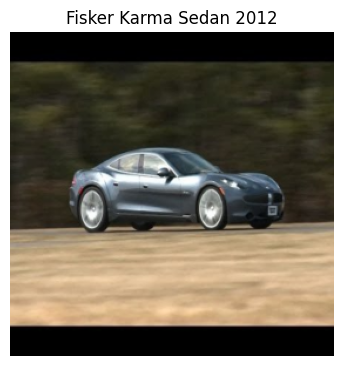

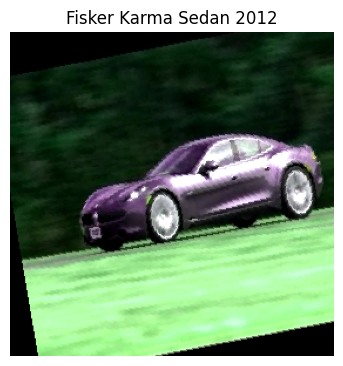

In [ ]:
def get_datasets(
    root_dir = './archive',
    train_dir = '/kaggle/input/cars196/archive/archive/cars_train/cars_train',
    test_dir = '/kaggle/input/cars196/archive/archive/cars_test/cars_test',
    mat_train = '/kaggle/input/cars196/devkit/devkit/cars_train_annos.mat',
    mat_test = '/kaggle/input/cars196/devkit/devkit/cars_test_annos.mat',
    train_size = 0.8,
    transform = base_transform,
    augmentation_flag = True,
    augmentation = base_augmentation,
    visualize_examples = False,
    label_to_name = id_to_car,
    idx_to_visualize = 0,
    dataset_type = CarsDatasetTriplets
    ):

                '''
                -Функция, которая реализует загрузку датасетов.
                -Включает в себя базовую трансформацию и аугментацию (опционально) данных

                Параметры:
                -root_dir: путь к папке (Опционально)
                -train_dir: путь к train папке
                -test_dir: путь к test папке
                -mat_train: путь к разметке train MATLAB
                -mat_test: путь к разметке теста MATLAB
                -train_size (float [0, 1]): Размер тренировочной выборки для сплита (default 0.8) 
                -transform = base_transform: torch transfrom - базовая трансформация данных
                -augmentation = base_augmentation - аугментация данных
                -visualize_examples: Bool - флаг, показывать картинки датасетов или нет
                -label_to_name: Dict - перевод label в строку string
                -idx_to_visualize: int - индекс в датасете для визуализации (по умолчанию 0)

                Возвращает:
                массив предобработанных датасетов (train, val & test)
                '''


                labels_test = {}

                mat_data_train = parse_mat(mat_train)
                mat_data_test = parse_mat(mat_test)

                samples_test = mat_data_test['annotations'][:][:][-1]

                for sample in samples_test:
                    labels_test[sample[-1][0]] = sample[-2][0][0]

                fname_to_class = {fname:cl-1 for fname, cl in zip([i[0] for i in mat_data_train['annotations'][0]['fname']], 
                                                [i[0][0] for i in mat_data_train['annotations'][0]['class']])}

                train_cars_base_dataset = dataset_type(
                    path = train_dir, 
                    labels = fname_to_class,
                    transform = transform
                )

                if augmentation_flag:
                    train_cars_augmented_dataset = dataset_type(
                        path = train_dir, 
                        labels = fname_to_class,
                        transform = augmentation
                    )

                test_cars_dataset = dataset_type(
                    path = test_dir, 
                    labels = labels_test,
                    transform = transform, test_flag=True
                )

                if visualize_examples:
                    if dataset_type == CarsDatasetTriplets:

                        # print(train_car_base_dataset[idx_to_visualize][2])
                        # print(label_to_name[train_car_base_dataset[idx_to_visualize][2]])
                        plot_image(unnormalize(train_cars_base_dataset[idx_to_visualize][0]), label_to_name[train_cars_base_dataset[idx_to_visualize][2]])
                        plot_image(unnormalize(train_cars_base_dataset[idx_to_visualize][1]), label_to_name[train_cars_base_dataset[idx_to_visualize][2]])

                        plot_image(unnormalize(train_cars_augmented_dataset[idx_to_visualize][0]), label_to_name[train_cars_augmented_dataset[idx_to_visualize][2]])
                        plot_image(unnormalize(train_cars_augmented_dataset[idx_to_visualize][1]), label_to_name[train_cars_augmented_dataset[idx_to_visualize][2]])

                    elif dataset_type == CarsDataset:

                        plot_image(unnormalize(train_cars_base_dataset[idx_to_visualize][0]), label_to_name[train_cars_base_dataset[idx_to_visualize][1]])
                        plot_image(unnormalize(train_cars_augmented_dataset[idx_to_visualize][0]), label_to_name[train_cars_augmented_dataset[idx_to_visualize][1]])

                full_data = ConcatDataset([train_cars_base_dataset, train_cars_augmented_dataset])
                train_size = int(train_size * len(full_data)) 
                val_size = len(full_data) - train_size
                train_dataset, validation_dataset = random_split(full_data, [train_size, val_size])


                return train_dataset, validation_dataset, test_cars_dataset


train_dataset, validation_dataset, test_dataset = get_datasets(
                                                        visualize_examples=True,
                                                        idx_to_visualize=101,
                                                        dataset_type=CarsDataset) # CarsDataset

#### Как мы видим, аугментации сработали корректно!	✅

#### Корректные изображения и их аугментации!

#### Контроль размерностей и вывода сэмплов датасета:

In [14]:
train_dataset[0][0].size()

torch.Size([3, 276, 276])

In [15]:
train_dataset[101][0].size(), train_dataset[101][1]

(torch.Size([3, 276, 276]), 113)

#### Выводим количество сэмплов:

In [16]:
print(len(train_dataset))
print(len(test_dataset))

13030
8041


#### Таким образом, аугментации добавили нам дополнительных изображений в датасет.

#### Функция получения dataloader'ов:

In [17]:
def get_dataloaders(
        train_dataset = train_dataset,
        val_dataset = validation_dataset,
        batch_size = 64,
        shuffle_train = True,
        shuffle_test = False
        ):

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle_train)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=shuffle_test)

    return train_loader, val_loader

train_loader, val_loader = get_dataloaders(batch_size = 312)

#### Dataloader'ы работают корректно ✅

#### Далее, объявляется класс модели с использованием pytroch_metric_learning, которая и будет обучаться!	✅

#### Здесь мы включаем Hard Mining для Триплетов	✅

In [ ]:
class modelTripletMarginLoss(pl.LightningModule):
	
	'''
	Класс модели с функцией потерь TripletMarginLoss (наследует методы из pl.LightningModule)
	'''
		
	def __init__(
			self, 
			model = resnet18(pretrained = True),
			embedding_size = 128,
			distance_metric = distances.CosineSimilarity(),
			reducer = reducers.ThresholdReducer(low=0),
			loss_fn = losses.TripletMarginLoss,
			miner = miners.TripletMarginMiner,
			margin = 0.2,
			type_of_triplets = "hard",
			optimizer = Adam,
			optimizer_params = {'lr': 0.001, 'weight_decay': 0.0001},
			class_dict = id_to_car,
			alpha = 0.4,
			min_lr = 1e-5,
			step_size = 8, 
			gamma = 0.5
			):
		
		'''
		Конуструктор объекта класс def __init__(self, ...)

		Парамеры:
		-model: Базовая модель (default: resnet18(pretrained = True))
		-embedding_size: Размер эмбеддингов после сверточных слоев для решения задачи Metric Learning (default = 128)
		-distance_metric: Метрика подсчета расстояния между объектами (default: CosineSimilarity())
		-reduce: Функция редукции потерь, которая используется для фильтрации значений loss на основе порогового значения.
		Например, ThresholdReducer(low=0) игнорирует все значения потерь ниже 0.
		Это может повысить устойчивость к шуму в данных (default: ThresholdReducer(low=0))
		-loss_fn: функция потерь (default: TripletMarginLoss)
		-margin: зазор для триплетов
		-miner: как будут майниться триплеты
		-type_of_triplets: тип триплетов (default: 'hard')
		-optimizer: оптимизатор (default: Adam)
		-optimizer_params: параметры оптимизатора
		-class_dict: словарь Dict label->name
		-alpha: делает сокращение лосса классификации (не самоцель предсказывать метку, но учесть хотели бы)
		-min_lr: минимальный шаг сходимости (тот предел, до которого уменьшается lr в процессе обучения)
		-step_size: число эпох, через которое экпоненциально уменьшаем шаг сходимости
		-gamma: уменьшающий множитель 

		Инициализирует всё необходимое

		'''

		super(modelTripletMarginLoss, self).__init__()
		self.backbone = model,
		self.backbone = self.backbone[0]
		self.embedding_size = embedding_size
		self.backbone.fc = nn.Linear(self.backbone.fc.in_features, self.embedding_size)
		self.fc = nn.Linear(self.embedding_size, self.embedding_size)
		self.distance = distance_metric
		self.reducer = reducer
		self.margin = margin
		self.type_of_triplets = type_of_triplets
		self.loss_fn = loss_fn(margin=self.margin, distance=self.distance, reducer=self.reducer)
		self.miner = miner(margin=self.margin, distance=self.distance, type_of_triplets=self.type_of_triplets)
		self.optimizer_params = optimizer_params
		self.optimizer = optimizer(self.parameters(), **self.optimizer_params)
		self.class_dict = class_dict
		self.classifier_head = torch.nn.Sequential(
					torch.nn.ReLU(),
						torch.nn.Linear(in_features=self.embedding_size, 
										out_features=len(self.class_dict)))

		self.alpha = alpha
		self.classif_loss = torch.nn.CrossEntropyLoss()
		self.save_hyperparameters()

		self.gamma = gamma
		self.step_size = step_size
		self.scheduler = StepLR(self.optimizer, step_size=self.step_size, gamma=self.gamma)
		self.min_lr = min_lr

		self.val_embeddings = []
		self.val_labels = []


	def forward(self, input_x):
		'''
		forward модели после подачи batch_size:

		Параметры:
		-self
		-input_x: входой пакет картинок

		Возвращает эмбеддинг картинки
		'''
		cnn_output = self.backbone(input_x)
		embedding = self.fc(cnn_output)
		return embedding

	def training_step(self, batch, batch_idx):
			'''
			Часть train логики: подаем батч, разбиваем на (images, labels)
			Возвращем loss, по которому будет считаться градиент
			'''

			images, labels = batch
			embeddings = self(images)
			hard_pairs = self.miner(embeddings, labels)
			loss_triplet = self.loss_fn(embeddings, labels, hard_pairs)

			predicted_labels = self.classifier_head(embeddings)
			loss_clf = self.classif_loss(predicted_labels, labels)

			final_loss = loss_clf*self.alpha + loss_triplet

			self.log('train_loss', final_loss, sync_dist=True)
			return final_loss

	def on_train_start(self):
		self.train()

	def validation_step(self, batch, batch_idx):
			
			'''
			Логика на валидации: подаем батч, считаем loss на валидации и записываем в tensor_board
			И добавляем эмбеддинги и метки для подсчёта метрик
			'''

			images, labels = batch
			embeddings = self(images)
			hard_pairs = self.miner(embeddings, labels)
			loss_triplet = self.loss_fn(embeddings, labels, hard_pairs)

			predicted_labels = self.classifier_head(embeddings)
			loss_clf = self.classif_loss(predicted_labels, labels)

			predicted_labels = torch.argmax(predicted_labels, dim=1)

			final_loss = loss_clf * self.alpha + loss_triplet
			self.log('validation_loss', final_loss, sync_dist=True)

			self.val_embeddings.append(embeddings)
			self.val_labels.append(labels)

	def on_validation_epoch_end(self):

		'''
		Логика в конце валидации: считает ключевые метрики на валидации (спойлер - несовсем верно,
		уже после обучения всё так)

		-precision@1, precision@5, recall@1, recall@5
		-Обнуляет массивы эмбеддингов и меток в конце
		'''
		
		all_embeddings = torch.cat(self.val_embeddings)
		all_labels = torch.cat(self.val_labels)

		accuracy_calculator = AccuracyCalculator(include=("precision_at_1",), k=1, knn_func = CustomKNN(
				distances.CosineSimilarity(), batch_size=64))

		metrics = accuracy_calculator.get_accuracy(all_embeddings, all_labels)
		precision_at_1 = metrics["precision_at_1"]
		# print(precision_at_1)
		self.log('precision_at_1_epoch', precision_at_1, sync_dist=True)

		prec, precision_at_5, recall_at_1, recall_at_5 = self.calculate_additional_metrics(all_embeddings, all_labels)
		# print(prec)
		# print(precision_at_5)
		# print(recall_at_1)
		# print(recall_at_5)
		self.log('precision_at_5_epoch', precision_at_5, sync_dist=True)
		self.log('recall_at_1_epoch', recall_at_1, sync_dist=True)
		self.log('recall_at_5_epoch', recall_at_5, sync_dist=True)
		
		self.val_embeddings = []
		self.val_labels = []
		
		return all_embeddings, all_labels

	def calculate_additional_metrics(self, embeddings, labels):

		'''
		Подсчет дополнительных метрик (precision@1 работает из коробки)

		-Используется CustomKNN() для как бы эмбеддингов и внутри них (по-хорошему train бы подавать и по нему оценивать точность)

		Вернет кортеж (precision@1, precision@5, recall@1, recall@5)

		'''
		knn = CustomKNN(distances.CosineSimilarity(), batch_size=64)

		# Получение меток ближайших соседей для 1 и 5
		_, knn_labels_1 = knn(embeddings, 2, embeddings)
		_, knn_labels_5 = knn(embeddings, 6, embeddings)

		# print(knn_labels_1)
		# print(knn_labels_5)

		precision_at_1 = []
		recall_at_1 = []
		precision_at_5 = []
		recall_at_5 = []

		# print(labels)

		for i in range(len(knn_labels_1)):

			# Извлекаем метки ближайших соседей (пропуская сам объект)
			reference_index_1 = knn_labels_1[i][1].item()  # первый ближайший сосед (не сам объект)
			reference_index_5 = knn_labels_5[i][1:6].tolist()  # следующие 5 соседей

			# print(reference_index_1)
			# print(reference_index_5)

			# Получение меток для ближайших соседей
			reference_labels_1 = labels[reference_index_1] if reference_index_1 < len(labels) else None
			reference_labels_5 = labels[reference_index_5] if all(idx < len(labels) for idx in reference_index_5) else None

			# print(reference_labels_1)
			# print(reference_labels_5)
			# Проверяем, есть ли корректные метки
			relevant_labels = [labels[i]]

			# Рассчитываем точность и полноту для 1 соседа
			if reference_labels_1 is not None:
				num_correct_1 = 1 if reference_labels_1==relevant_labels[0] else 0
				precision_at_1.append(num_correct_1 / 1)  # Precision@1
				recall_at_1.append(num_correct_1 / len(relevant_labels) if relevant_labels else 0)  # Recall@1

			# Рассчитываем точность и полноту для 5 соседей
			if reference_labels_5 is not None:
				# print('here')
				# print(reference_labels_5)
				num_correct_5 = sum(1 for label in reference_labels_5 if label in relevant_labels)
				precision_at_5.append(num_correct_5 / 5)  # Precision@5
				recall_at_5.append(num_correct_5 / len(relevant_labels) if relevant_labels else 0)  # Recall@5

		# Средние значения
		precision_at_1 = sum(precision_at_1) / len(precision_at_1) if precision_at_1 else 0
		recall_at_1 = sum(recall_at_1) / len(recall_at_1) if recall_at_1 else 0
		precision_at_5 = sum(precision_at_5) / len(precision_at_5) if precision_at_5 else 0
		recall_at_5 = sum(recall_at_5) / len(recall_at_5) if recall_at_5 else 0

		return precision_at_1, recall_at_1, precision_at_5, recall_at_5


	def on_validation_start(self):
			self.eval()

	def configure_optimizers(self):

		'''
		Объявление оптимизатора и его фичей
		'''

		return {
			'optimizer': self.optimizer,
			'lr_scheduler': {
				'scheduler': self.scheduler,
				'interval': 'epoch',
				'frequency': 1,
				'reduce_on_plateau': False,
				'monitor': 'validation_loss',
			}
		}

	def lr_scheduler_step(self, scheduler, metric):

		'''
		Обновление шага сходимости
		'''

		scheduler.step()
		self._adjust_learning_rate()

	def _adjust_learning_rate(self):
		'''
		Проверка достижения предела learning_rate (self.min_lr)
		'''
		
		for param_group in self.optimizer.param_groups:
			param_group['lr'] = max(param_group['lr'], self.min_lr)



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 195MB/s]


#### Класс объявлен. В следующей ячейке инициализируется модель и её параметры:	✅

In [ ]:
'''
Блок инициализации модели и её фичей
'''

'''Объявляем device (на kaggle 'gpu')'''
device = 'gpu' if torch.cuda.is_available() else 'cpu'
print(device)

'''Инициализируем модель. Через 15 (step_size = 15) эпох уменьшаем learning_rate'''
model = modelTripletMarginLoss(step_size=15)

'''
Полезные утилиты:

-early_stopping: обрываем обучение, если loss на валидации не падает в течение 5 эпох
-lr_monitor: мониторинг шага сходимости (чтобы его тоже логировать в TensorBoard)
'''
pl_model = model
checkpoint_callback = ModelCheckpoint(monitor='validation_loss',mode='min',save_top_k=3)
early_stopping = EarlyStopping(monitor="validation_loss", mode="min", patience=5)
lr_monitor = LearningRateMonitor(logging_interval='step')

'''
Логирование по качеству в TensorBoard:

-checkpoint_callback_1: сохранять Топ-3 по лоссу на валидации
-checkpoint_callback_2: сохранять Топ-2 по метрике precision_at_1
'''
tensorboard_logger = TensorBoardLogger("tb_logs", name="cars196_model_tripletloss_lr_scheduler_70")
checkpoint_callback_1 = ModelCheckpoint(
	monitor='validation_loss',  
	mode='min', 
	save_top_k=3, 
	filename='best-checkpoint-tripletloss-{epoch:02d}-{validation_loss:.2f}'  
)

checkpoint_callback_2 = ModelCheckpoint(
	monitor='precision_at_1_epoch',  
	mode='max', 
	save_top_k=2,  
	filename='best-accuracy-tripletloss-{epoch:02d}-{precision_at_1_epoch:.2f}'  
)

'''
PyTorchLightning Module:

Ключевые параметры:
-max_epochs = 100: Максимум 100 эпох будем обучать
-min_epochs = 70: Минимум 70 эпох будем обучать
'''

trainer = pl.Trainer(
	max_epochs=100,
    min_epochs = 70,
	accelerator=device,
	devices=1,
	logger=tensorboard_logger,
	callbacks=[checkpoint_callback_1, checkpoint_callback_2, early_stopping, lr_monitor],
	log_every_n_steps=1,  
	enable_progress_bar=True  
)



#### Здесь происходит обучение:	✅

In [ ]:
trainer.fit(pl_model, train_loader, val_loader)

#### Логи обучения модели в TensorBoard:

#### Train loss:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/interpretation_metric_learning/submit_folder/logs_triplet_loss/train_triplet_logs.png" alt="alt text" width="600"/>

#### Val loss:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/interpretation_metric_learning/submit_folder/logs_triplet_loss/val_triplet_loss.png" alt="alt text" width="600"/>

#### Далее загружаем лучшие по loss и precision модели:

In [ ]:
model_best_precision = modelTripletMarginLoss.load_from_checkpoint('/kaggle/input/checkpoints/pytorch/checkpoint_triplet_loss/1/checkpoints/best-precision1-tripletloss-epoch65-precision_at_1_epoch0.89.ckpt')

trainer = pl.Trainer()
trainer.validate(model_best_precision, val_loader)

#### Самый низкий loss:

In [21]:
model_best_val_loss = modelTripletMarginLoss.load_from_checkpoint('/kaggle/input/checkpoints/pytorch/checkpoint_triplet_loss/1/checkpoints/best-checkpoint-tripletloss-epoch66-validation_loss0.45.ckpt')

trainer = pl.Trainer()
trainer.validate(model_best_val_loss, val_loader)

Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│   precision_at_1_epoch    │    0.8821362853050232     │
│   precision_at_5_epoch    │    0.8824431896209717     │
│     recall_at_1_epoch     │    0.8467157483100891     │
│     recall_at_5_epoch     │     4.233578681945801     │
│      validation_loss      │    0.4616535007953644     │
└───────────────────────────┴───────────────────────────┘

[{'validation_loss': 0.4616535007953644,
  'precision_at_1_epoch': 0.8821362853050232,
  'precision_at_5_epoch': 0.8824431896209717,
  'recall_at_1_epoch': 0.8467157483100891,
  'recall_at_5_epoch': 4.233578681945801}]

In [22]:
model_best_val_loss.eval()
model_best_val_loss.to('cuda')
np.float32

numpy.float32

#### Функция получения эмбеддингов и меток:

In [ ]:
device = 'cuda'
def get_embeds(model, loader):
	
	'''
	Функция получения эмбеддингов и меток для train и val, для train еще и картинок

	Параметры:
	-model: модель
	-loader: итератор (train_loader/val_loader)

	Возвращает кортеж (эмбеддинги, метки и тензоры (картинки))
	'''
	
	embeddings = np.empty((1, 128))
	imgs_list = []
	labels = np.empty((1))
	for batch in tqdm(loader):
		imgs, label = batch
		with torch.no_grad():
			preds = model(imgs.to(device))
		
		embeddings = np.concatenate([embeddings, preds.cpu().numpy()])
		labels = np.concatenate([labels, label.numpy()])
		imgs_list.append(imgs.cpu())
	return embeddings[1:].astype(np.float32), labels[1:], torch.cat(imgs_list, dim=0)

train_emb, train_labels, images_train = get_embeds(model_best_val_loss, train_loader)
val_emb, val_labels, _ = get_embeds(model_best_val_loss, val_loader)

100%|██████████| 11/11 [00:57<00:00,  5.20s/it]


In [24]:
train_emb.shape, val_emb.shape, train_labels.shape

((13030, 128), (3258, 128), (13030,))

In [25]:
images_train.size()

torch.Size([13030, 3, 276, 276])

#### Класс UpdDatasetNew:

In [ ]:
class UpdDatasetNew(Dataset):
	
	'''
	Класс датасета для трейнов 
	*** чтобы правильные метки были, исходный передавать нельзя из-за shuffle'ов и так далее ***
	'''
		
	def __init__(self, data, labels):
		self.data = data
		self.labels = labels.astype('int')

	def __len__(self):
		return len(self.data)

	def __getitem__(self, idx):
		return self.data[idx], self.labels[idx]
	
upd_train_dataset = UpdDatasetNew(images_train, train_labels)

#### Применение faiss:

In [27]:
index = faiss.IndexFlatL2(128)   
print(index.is_trained)
index.add(train_emb)                 
print(index.ntotal)

True
13030


#### Исследуем соседей для k=1:

In [28]:
Distances, Indexes = index.search(val_emb, 1)

In [29]:
Indexes

array([[ 9259],
       [ 8965],
       [ 4583],
       ...,
       [12328],
       [ 9826],
       [ 9218]])

In [30]:
train_labels[Indexes.flatten()]

array([107., 126.,  57., ..., 125.,  28.,  10.])

In [31]:
val_labels

array([107., 126.,  57., ..., 125.,  28.,  10.])

In [32]:
print(f'Precision/Recall @ 1 : {np.sum((val_labels == train_labels[Indexes.flatten()]))/val_labels.shape[0]}')

Precision/Recall @ 1 : 0.8483732351135667


In [33]:
Indexes.flatten()

array([ 9259,  8965,  4583, ..., 12328,  9826,  9218])

#### Визуализируем соседа (True предсказания):

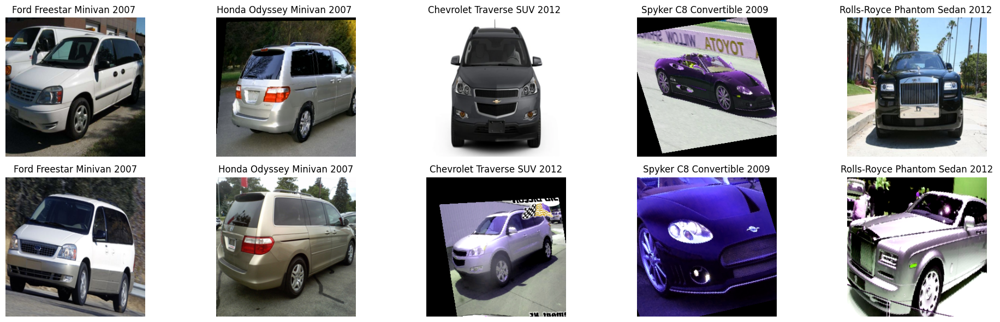

In [ ]:
def show_results_k1(num_images_pairs = 5, errors = False, validation_dataset = validation_dataset,
					train_dataset = upd_train_dataset,
					Indexes = Indexes):
	

	'''
	Функция вывода предсказаний при 1 ближайшем соседе

	Параметры:
	-num_images_pairs: количество пар изображений, которые мы хотим получить
	-errors (Bool): флаг показа ошибок (default False)
	-validation_dataset: валидационный датасет
	-train_dataset: тренировочный датасет
	-Indexes: индекс от Faiss
	'''


	fig, axes = plt.subplots(2, num_images_pairs, figsize=(20, 6))
	count = 0
	def plot_val_train_img(i, idx):

		'''
		Объявленная внутренняя функция для отображения

		Параметры:
		-i: индекс в валидационном датасете
		-idx: значения соседа из Indexes
		'''
		
		val_img = validation_dataset[i][0].detach().clone()
		label = validation_dataset[i][1]
		validation_img = unnormalize(val_img).permute(1, 2, 0).numpy()
		axes[0, count].imshow(validation_img)
		axes[0, count].set_title(f'{id_to_car[label]} ')
		axes[0, count].axis('off')

		train_img = train_dataset[idx][0].detach().clone()
		label = train_dataset[idx][1]
		training_img = unnormalize(train_img).permute(1, 2, 0).numpy()
		axes[1, count].imshow(training_img)
		axes[1, count].set_title(f'{id_to_car[label]}')
		axes[1, count].axis('off')
				
	for i, (image, label) in enumerate(validation_dataset):
		
		idx = Indexes.flatten()[i]
		if not errors:
			if label == train_dataset[idx][1]:
				plot_val_train_img(i , idx)
				count+=1
			if count == num_images_pairs:
				break
		else:
			if label != train_dataset[idx][1]:
				plot_val_train_img(i , idx)
				count+=1
			if count == num_images_pairs:
				break
	
show_results_k1()
				
plt.tight_layout()
plt.show()

#### Визуализируем ошибки модели:

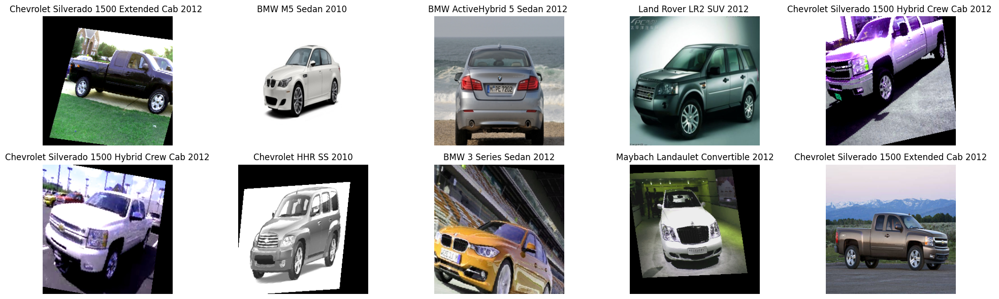

In [35]:
show_results_k1(errors=True)
                
plt.tight_layout()
plt.show()

#### Для числа соседей k = 5:

In [36]:
Distances5, Indexes5 = index.search(val_emb, 5)

In [49]:
correct_matches = (val_labels[:, None] == train_labels[Indexes5])
precision_at_5 = []
recall_at_5 = []
for neighbors in correct_matches:
    precision_at_5.append(np.sum(neighbors) / 5)
    recall_at_5.append(np.sum(neighbors))

print(f'Precision@5: {np.mean(precision_at_5)}')
print(f'Recall@5: {np.mean(recall_at_5)}')
    

Precision@5: 0.8186617556783303
Recall@5: 4.093308778391651


#### Визуализируем корректные предсказания:

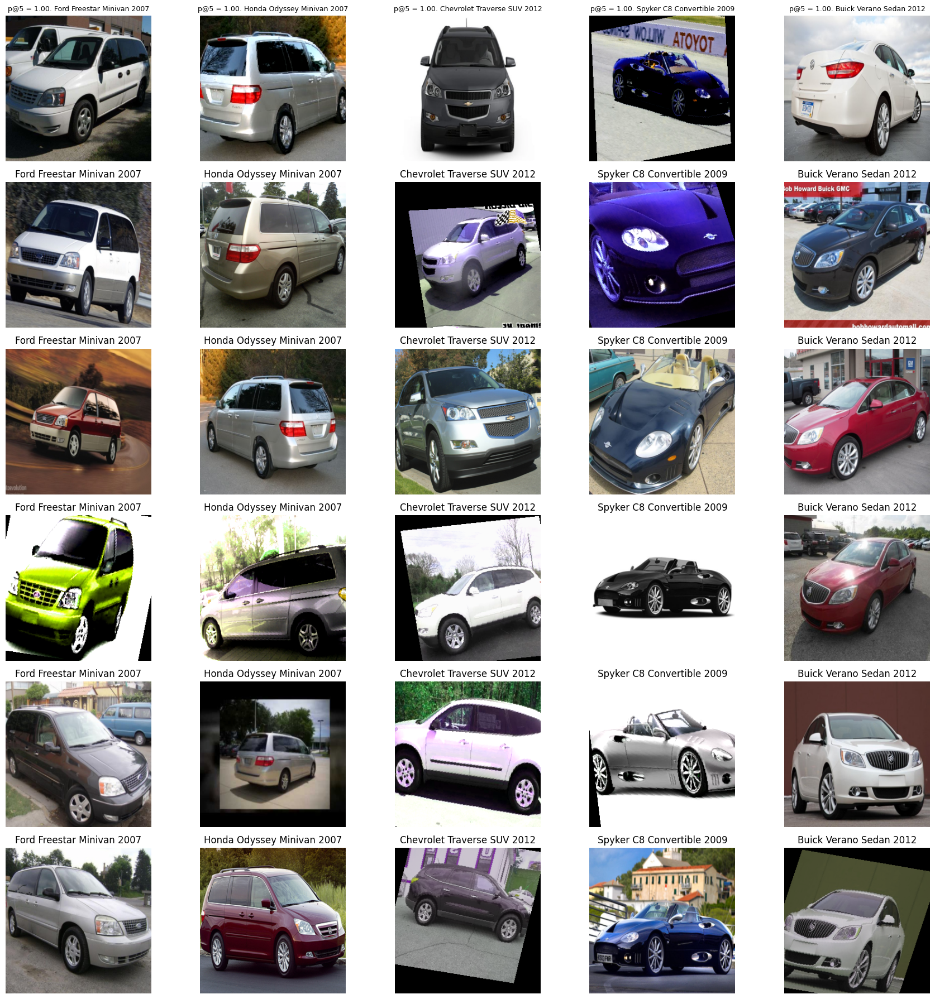

In [ ]:
def show_results_k5(num_images_in_series=5, errors=False, validation_dataset=validation_dataset,
					train_dataset=upd_train_dataset, Indexes=Indexes5,
				precision_threshold = 0.75):
	
	'''
	Функция отображения результатов для 5 ближайщих соседей

	Параметры:
	-num_images_pairs: количество пар изображений, которые мы хотим получить
	-errors (Bool): флаг показа ошибок (default False)
	-validation_dataset: валидационный датасет
	-train_dataset: тренировочный датасет
	-Indexes: индекс от Faiss
	-precision_threshold: float (В случае errors = True ошибкой будем считать те случаи,
	когда precison@5 будет ниже данного threshold'а)
	
	'''
	
	fig, axes = plt.subplots(6, 5, figsize=(18, 18)) 
	count = 0

	def plot_val_train_img(i, idxs, precision_at_5):

		'''
		Объявленная внутренняя функция для отображения

		Параметры:
		-i: индекс в валидационном датасете
		-idx: значения соседа из Indexes
		-precision_at_5: значение precision@5 для отображения в заголовке

		'''
		
		val_img = validation_dataset[i][0].detach().clone()
		label = validation_dataset[i][1]
		validation_img = unnormalize(val_img).permute(1, 2, 0).numpy()
		
		axes[0, count].imshow(validation_img)
		axes[0, count].set_title(f'p@5 = {precision_at_5:.2f}. {id_to_car[label]}', fontsize=9)
		axes[0, count].axis('off')
		
		for j, idx in enumerate(idxs):
			train_img = train_dataset[idx][0].detach().clone()
			label = train_dataset[idx][1]
			training_img = unnormalize(train_img).permute(1, 2, 0).numpy()
			axes[j+1, count].imshow(training_img)
			axes[j+1, count].set_title(f'{id_to_car[label]}')
			axes[j+1, count].axis('off')
		
	for i, (image, label) in enumerate(validation_dataset):
		idxs = Indexes[i]
		correct_matches = (val_labels[i, None] == train_labels[idxs])
		precision_in_group = np.sum(correct_matches) / 5

		if not errors:
			if precision_in_group > precision_threshold: 
				plot_val_train_img(i, idxs, precision_in_group)
				count += 1
			if count == num_images_in_series:  
				break
		else:
			if precision_in_group < precision_threshold:  
				plot_val_train_img(i, idxs, precision_in_group)
				count += 1
			if count == num_images_in_series: 
				break

show_results_k5()
plt.tight_layout()
plt.show()


#### И ошибки:

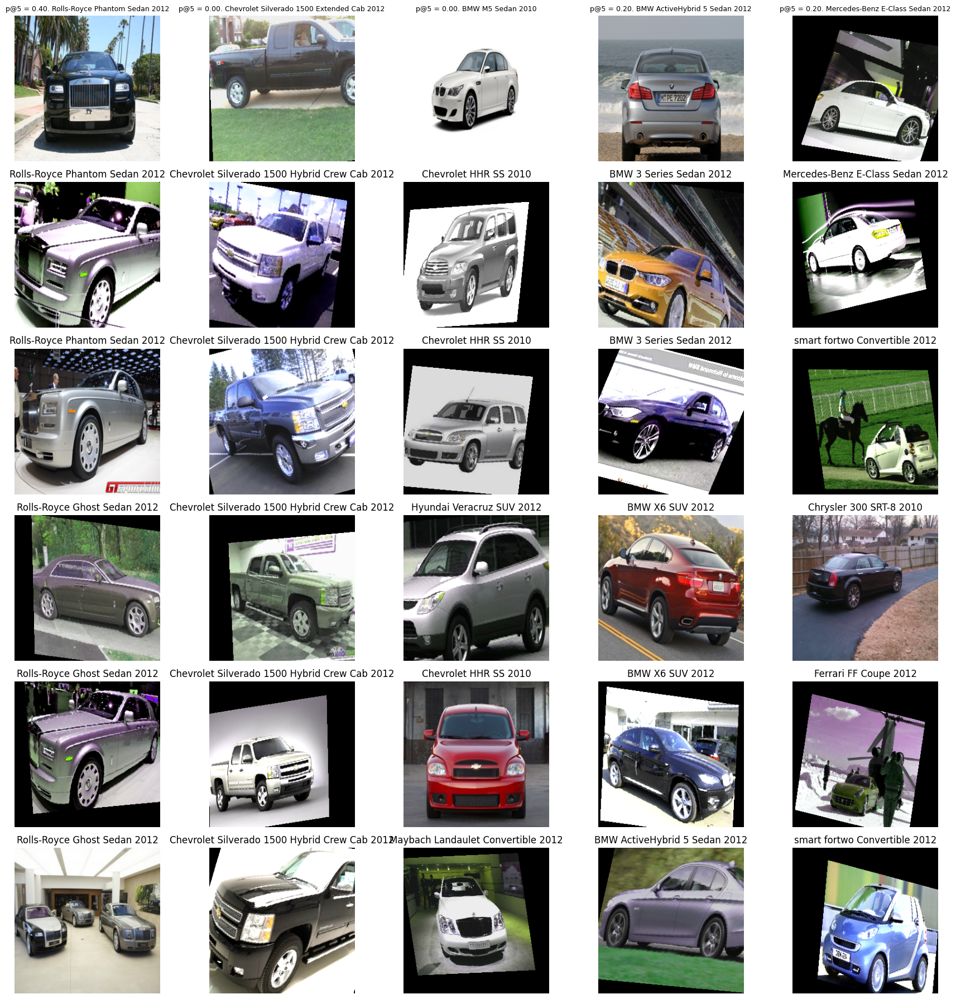

In [69]:
show_results_k5(errors=True)
plt.tight_layout()
plt.show()


#### Итак, модель работает, но в ноутбуке про ArcFaceLoss показывается более высокая точность модели.